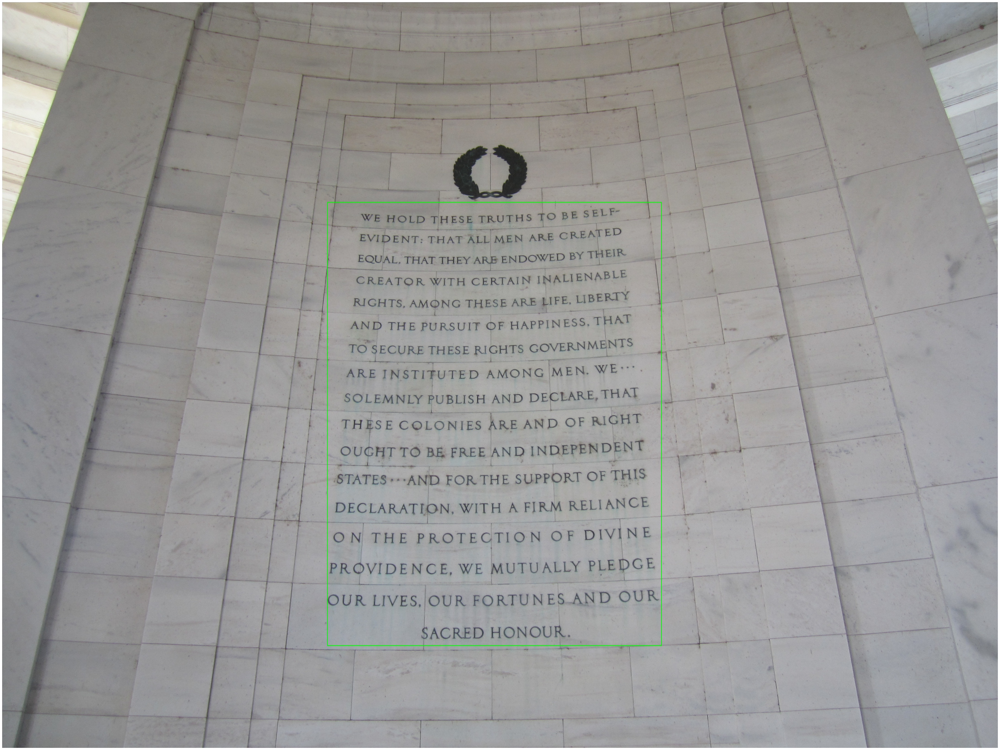

In [108]:
import os
import sys
sys.path.append(os.path.join(".."))
import cv2
import numpy as np
from utils.imutils import jimshow
from utils.imutils import jimshow_channel
import matplotlib.pyplot as plt
"""
---------- Parameters ----------
"""
#Image
jeff_img = cv2.imread("../data/jefferson_memorial.jpg") 
tester = jeff_img.copy()
#find Height and widt
#(width, height) = jeff_img.shape[1], jeff_img.shape[0]

###Crop image
(centerX, centerY) = jeff_img.shape[1] // 2, jeff_img.shape[0] // 2

x_pixels_left = 750
x_pixels_right = 700

y_pixels_up = 750
y_pixels_down = 1175

cropped = jeff_img[(centerY - y_pixels_up):(centerY + y_pixels_down),
                   (centerX - x_pixels_left):(centerX + x_pixels_right)]

cv2.imwrite("test.jpg", cropped)

start_point = ((centerX - x_pixels_left), (centerY - y_pixels_up))
end_point = ((centerX + x_pixels_right), (centerY + y_pixels_down))

jimshow(cv2.rectangle(jeff_img.copy(),
                      start_point,
                      end_point,
                      (0,255,0),
                      2))


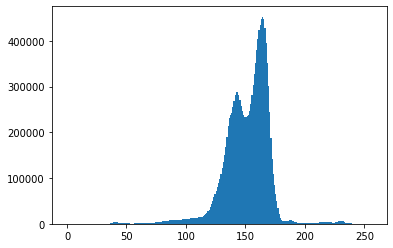

In [53]:
grey_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.hist(grey_image.flatten(), 256, [0,256]) 
plt.show()

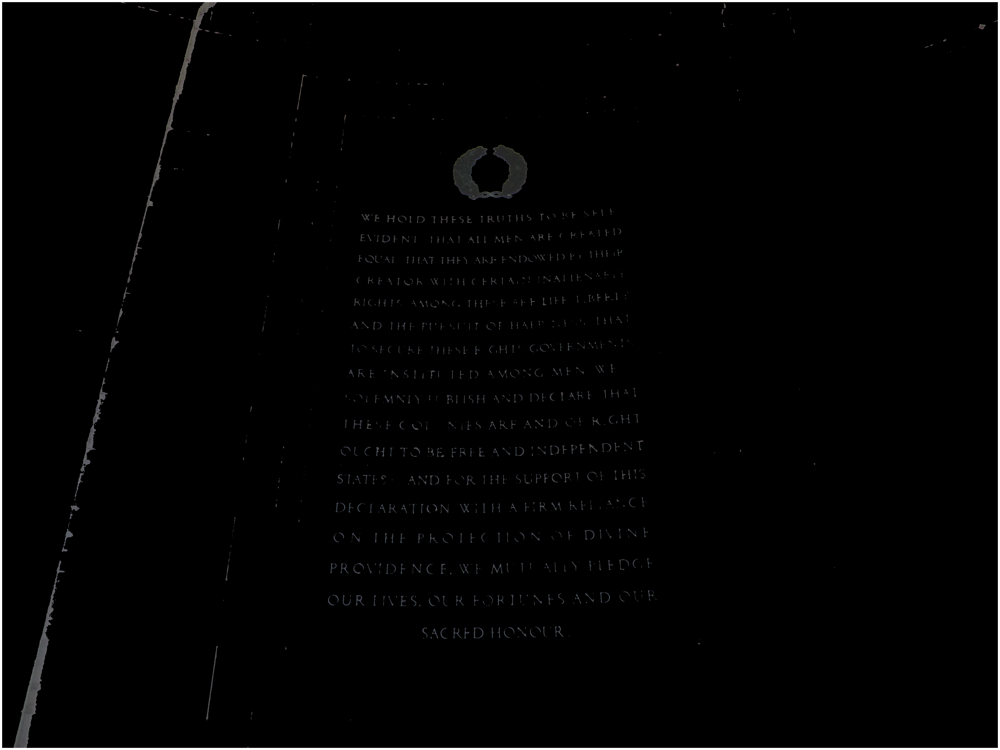

In [62]:
blurred = cv2.blur(grey_image, (5,5))
#jimshow_channel(blurred)
(t_val, threshold) = cv2.threshold(blurred, 100, 255, cv2.THRESH_BINARY)
(t_val, thresh_inverted) = cv2.threshold(blurred, 100, 255, cv2.THRESH_BINARY_INV)
#jimshow_channel(threshold)
jimshow(cv2.bitwise_and(image, image, mask = thresh_inverted)) 
#(#t_val, thresh_inverted) = cv2.threshold(blurred, 200, 255, cv2.THRESH_BINARY_INV)

In [ ]:
"""
---------- Main function ----------
"""
def main():
    """
    Crop image
    """
    jeff_img = Image.open("../data/jefferson_memorial.jpg") 
    # Setting the points for cropped image 
    # These were found through a combination of intuition and trial and error
    left = width//4
    top = height//4
    right = (width//4)*3
    bottom = (height//8)*7
  
    # Cropped image of above dimension  
    jeff_img = jeff_img.crop((left, top, right, bottom)) 
    
    #Convert cropped image from PIL type to array
    #This is done because I'm using the PIL library to crop the image.
    jeff_img = np.array(jeff_img)
    
    #Save cropped image
    cv2.imwrite("../output/image_cropped.jpg", jeff_img)
    #jeff_img.save("../output/image_cropped.jpg")
    
    """
    Blur and canny edge detection
    """
    #Convert to greyscale
    grey_cropped = cv2.cvtColor(jeff_img, cv2.COLOR_BGR2GRAY)
    #Gaussian blur
    blurred = cv2.GaussianBlur(grey_cropped, (5,5), 0)
    #Canny blur
    canny = cv2.Canny(blurred, 100, 150)

    """
    Find and draw contours
    """
    #Find contours
    (contours, _) = cv2.findContours(canny.copy(),
                cv2.RETR_EXTERNAL,
                cv2.CHAIN_APPROX_SIMPLE)
    #Draw contours
    image_contours = cv2.drawContours(jeff_img.copy(), #Draw contours on original
                        contours, #our list of contours
                         -1, #Which contour to draw (-1 draws all contours)
                        (0,255,0), #Contour color
                         2)
    #Save image
    cv2.imwrite("../output/image_letters.jpg", image_contours)